# Load Packages

In [3]:

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import folium
from mpl_toolkits.mplot3d import Axes3D
import geopandas as gpd
from shapely.geometry import Point
import warnings

%matplotlib inline

# Load Dataset
- we explore `hdb_transaction_coordinates.csv`
- check how the dataset looks like
- check the shape of the dataset

In [4]:
file_path = 'data/modified/hdb_transaction_coordinates.csv'

df = pd.read_csv(file_path)

columns_to_drop = ['Unnamed: 0', 'Unnamed: 0_x', 'Unnamed: 0_y']
df.drop(columns=columns_to_drop, inplace=True)

FileNotFoundError: [Errno 2] No such file or directory: 'data/modified/hdb_transaction_coordinates.csv'

In [ ]:
df.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,address,latitude,longitude
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0,174 ANG MO KIO AVE 4,1.375097,103.837619
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0,541 ANG MO KIO AVE 10,1.373922,103.855621
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0,163 ANG MO KIO AVE 4,1.373552,103.838169
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0,446 ANG MO KIO AVE 10,1.367761,103.855357
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0,557 ANG MO KIO AVE 10,1.371626,103.857736


In [ ]:
df.shape

(37153, 14)

In [ ]:
unique_town_count = df['town'].nunique()
print("Number of unique towns:", unique_town_count)

unique_flat_type = df['flat_type'].nunique()
print("Number of unique flat_type:", unique_flat_type)

unique_flat_model = df['flat_model'].nunique()
print("Number of unique flat_model:", unique_flat_model)

Number of unique towns: 26
Number of unique flat_type: 7
Number of unique flat_model: 20


# Data Exploration and Visualization

## Pairplot for numerical variables

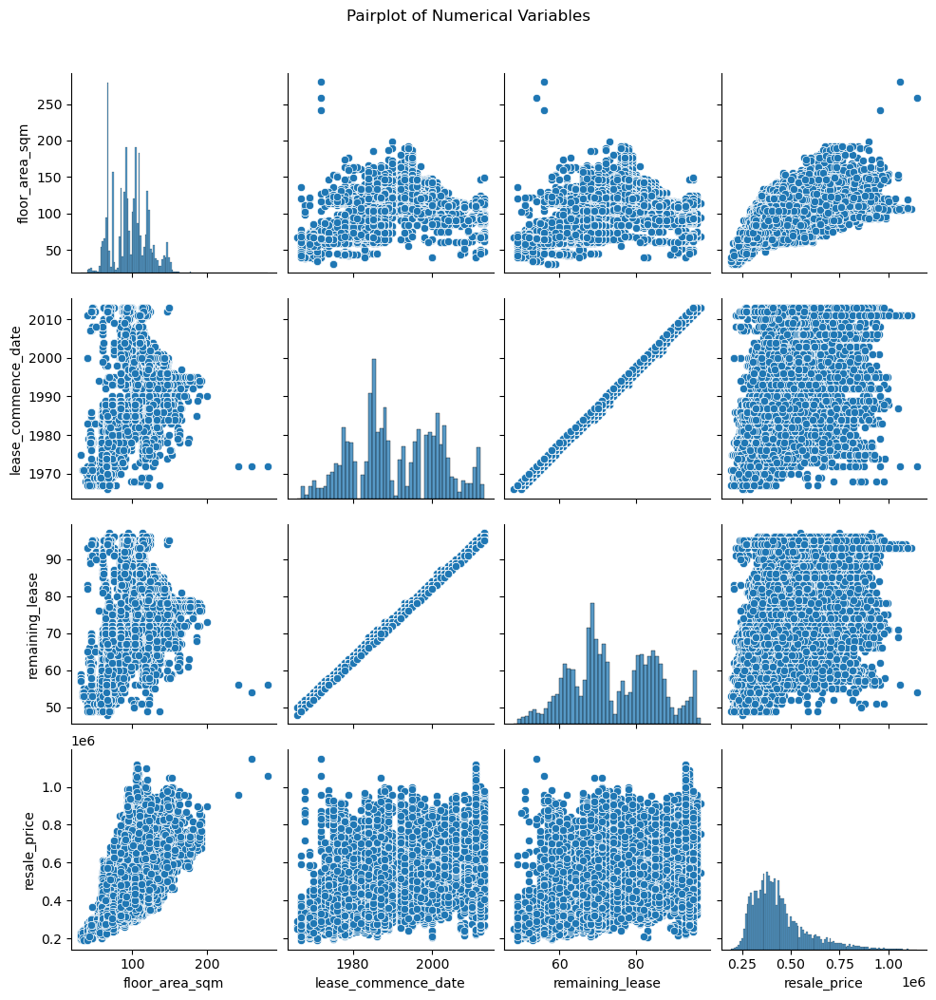

In [ ]:
warnings.filterwarnings("ignore")
sns.pairplot(df[['floor_area_sqm', 'lease_commence_date', 'remaining_lease', 'resale_price']])
plt.suptitle('Pairplot of Numerical Variables', y=1.05)
plt.show()

1. **Floor Area (sqm) vs. Resale Price**:
   - There appears to be a positive correlation between `floor_area_sqm` and `resale_price`. This suggests that larger flats tend to have higher resale prices.

2. **Lease Commence Date**:
   - There's a concentration of data points in certain periods indicating that there were more flats built or transacted during these times.
   - It is difficult to discern a clear pattern or trend between `lease_commence_date` and `resale_price` from the scatter plots, suggesting that the age of the lease may not have a straightforward linear relationship with price.

3. **Remaining Lease**:
   - There seems to be a moderate negative relationship between `remaining_lease` and `lease_commence_date`, which is expected as older flats will have a shorter remaining lease.
   - The scatter plot between `remaining_lease` and `resale_price` does not show a clear linear relationship, indicating that the remaining lease may not be the primary factor influencing price.

4. **Resale Price**:
   - The distribution of `resale_price` is right-skewed, meaning that there are a few flats with much higher prices compared to the rest, which could be attributed to factors not shown on this pairplot, such as location within Ang Mo Kio, the condition of the flat, or market conditions at the time of sale.
   - `resale_price` also seems to show a wide range of values for similar floor areas and lease commence dates, suggesting that there are other variables at play influencing the resale price.

5. **Distributions**:
   - The histograms along the diagonal show the distribution of each variable. The `resale_price` and `floor_area_sqm` are right-skewed, indicating the presence of some high-value outliers. The `lease_commence_date` shows multiple peaks, suggesting that there might be periods of high construction activity followed by less activity. The `remaining_lease` has a more uniform distribution with a slight left skewness.

Let's now group the datasets by town, flat_type and flat_model to see if there are differences within each of these categories.

### Flat Type

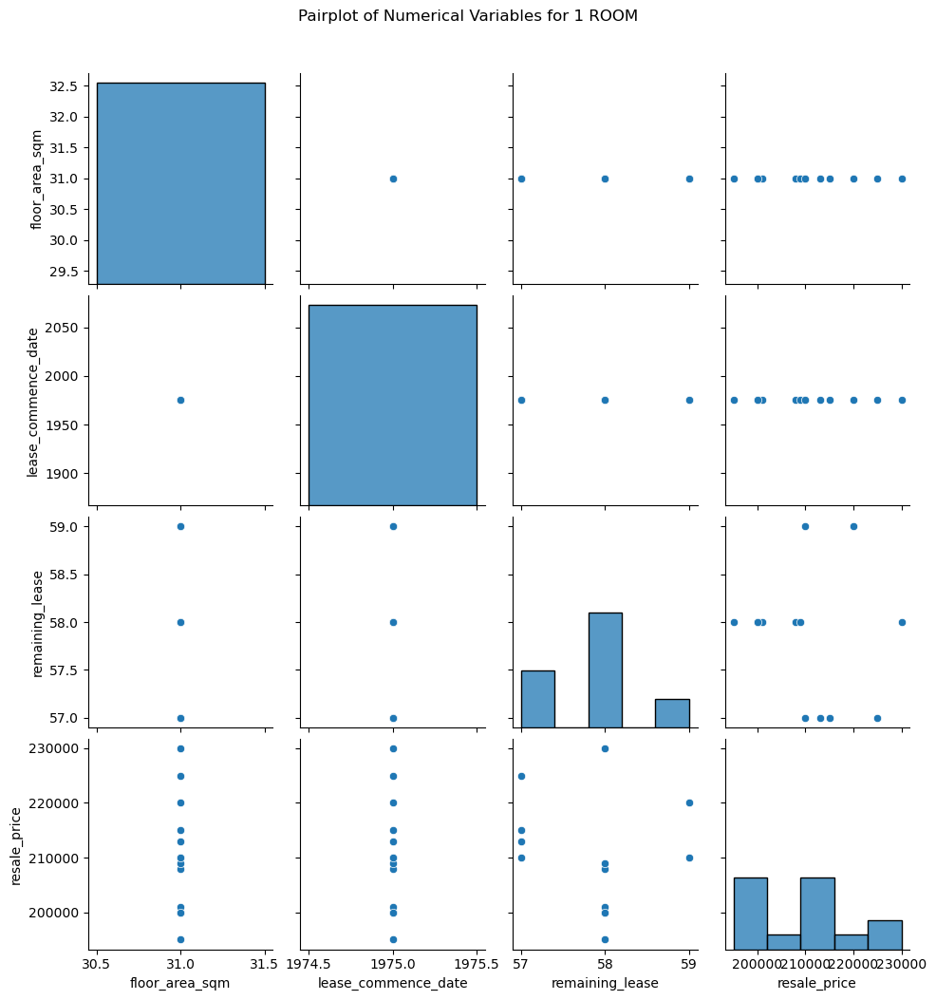

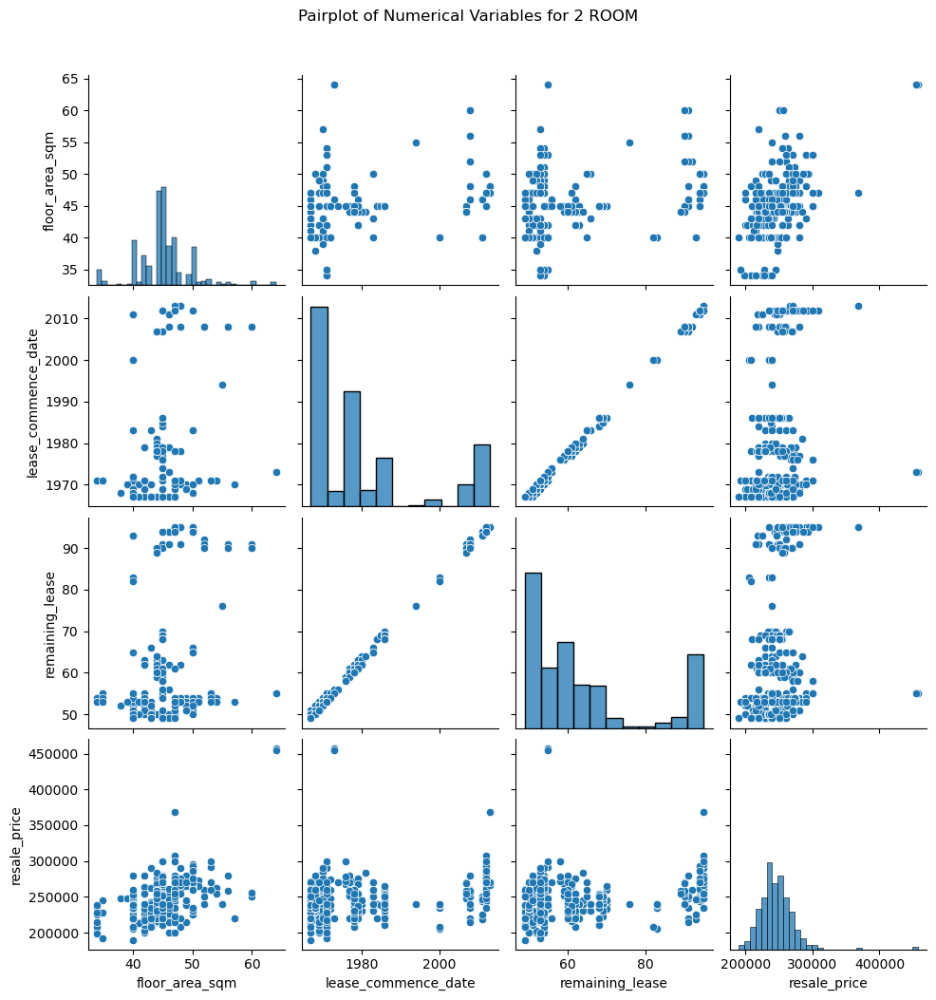

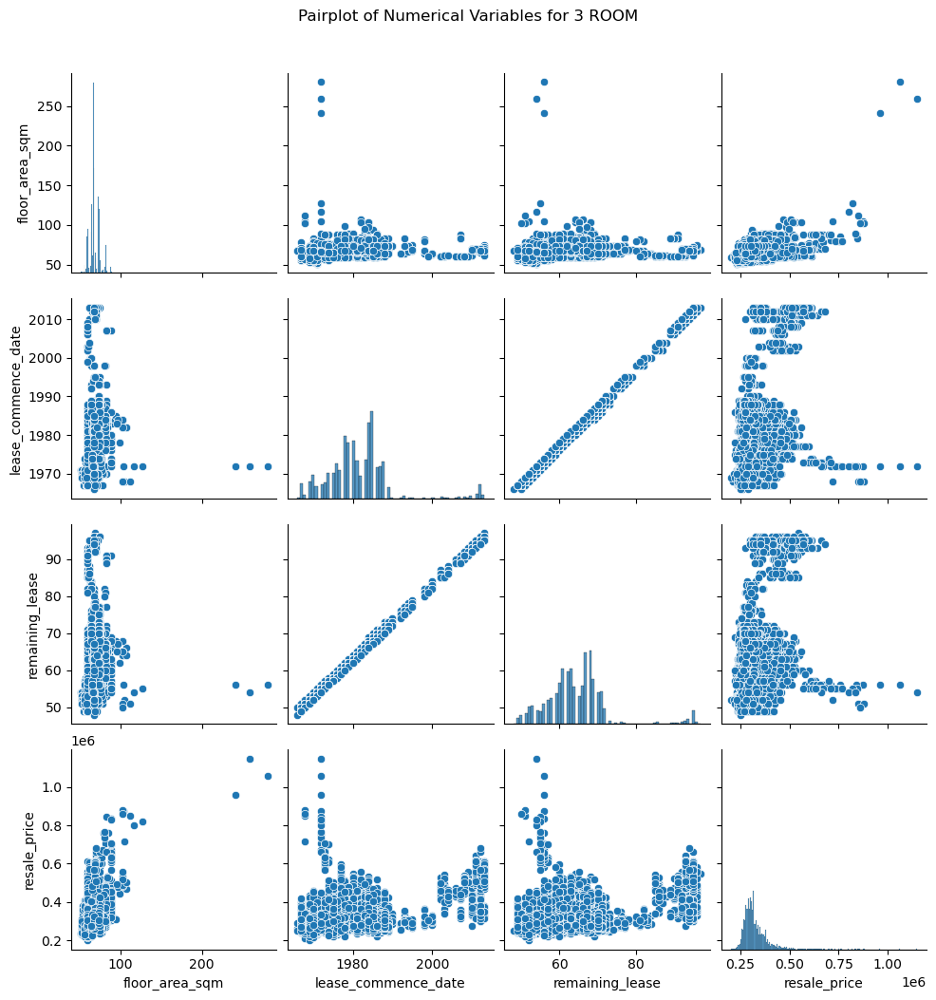

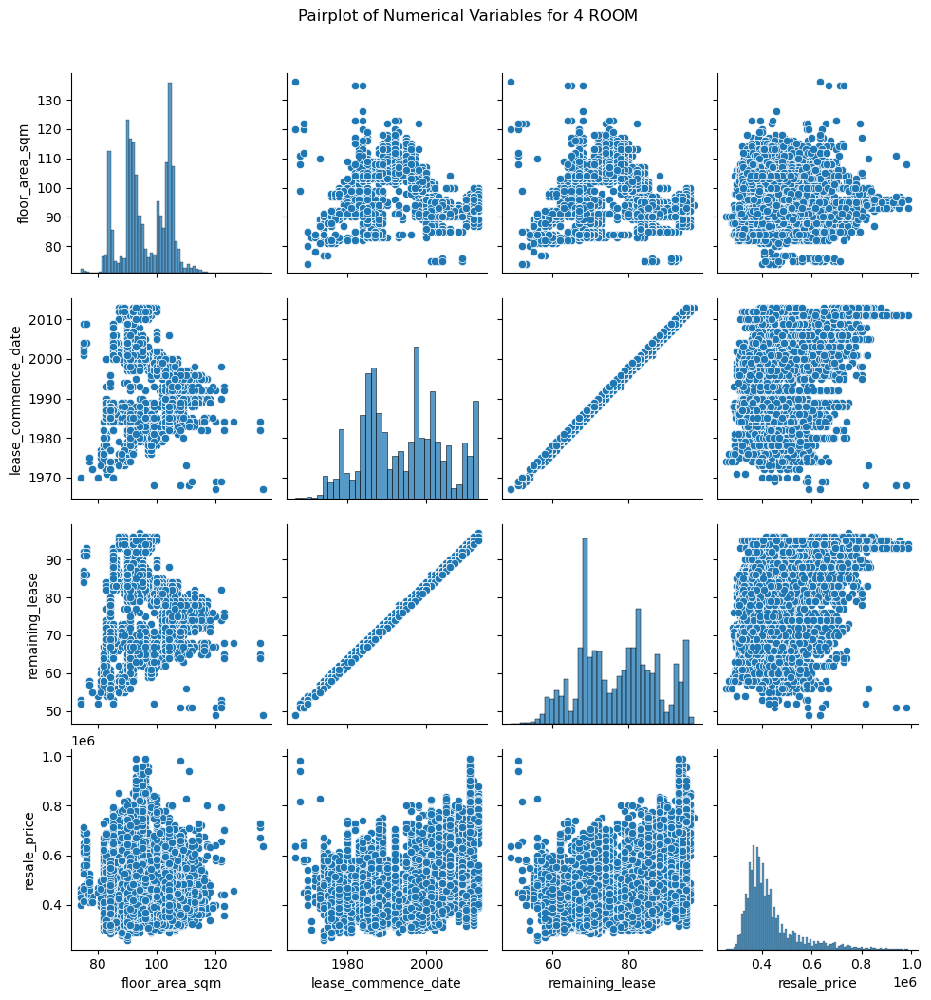

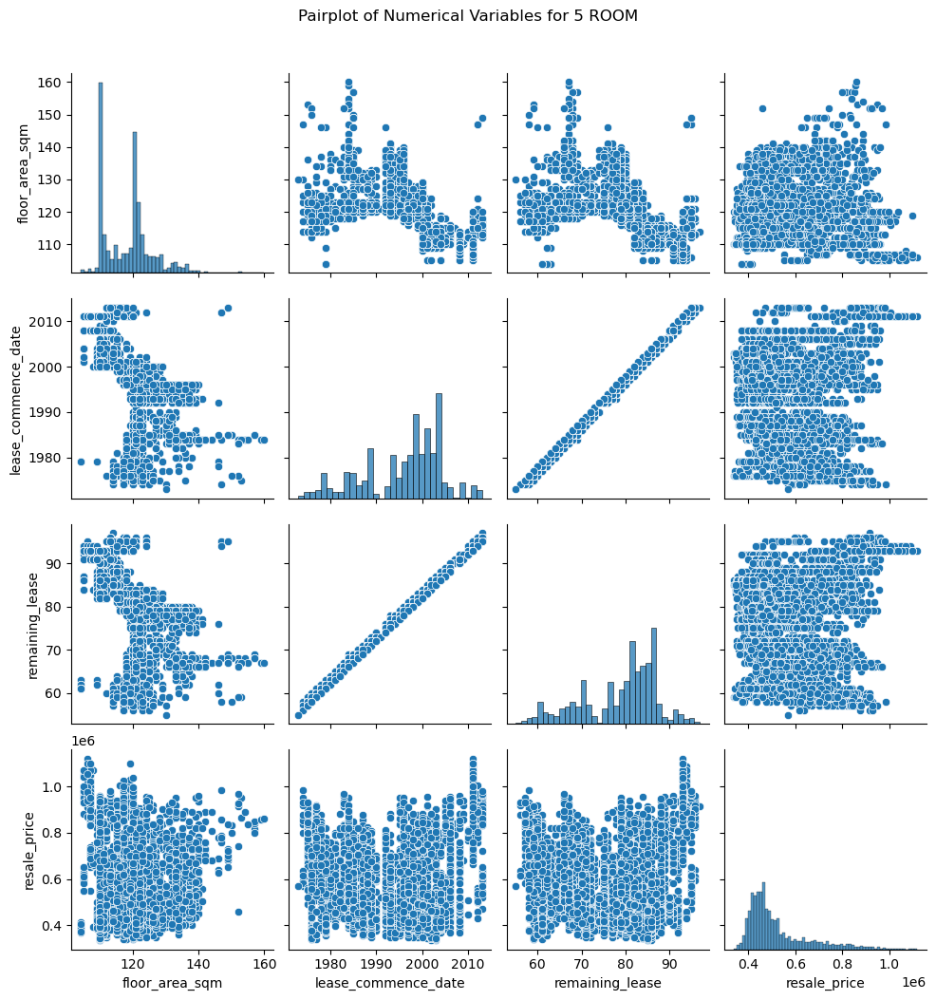

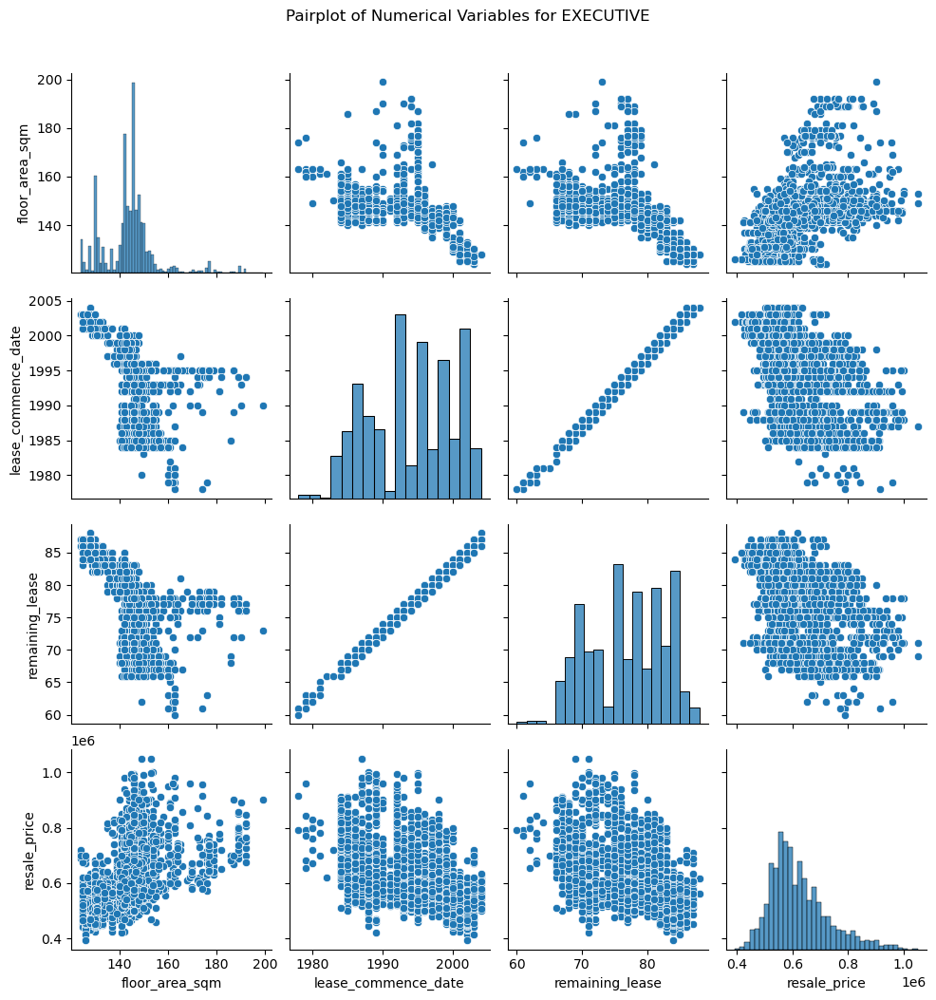

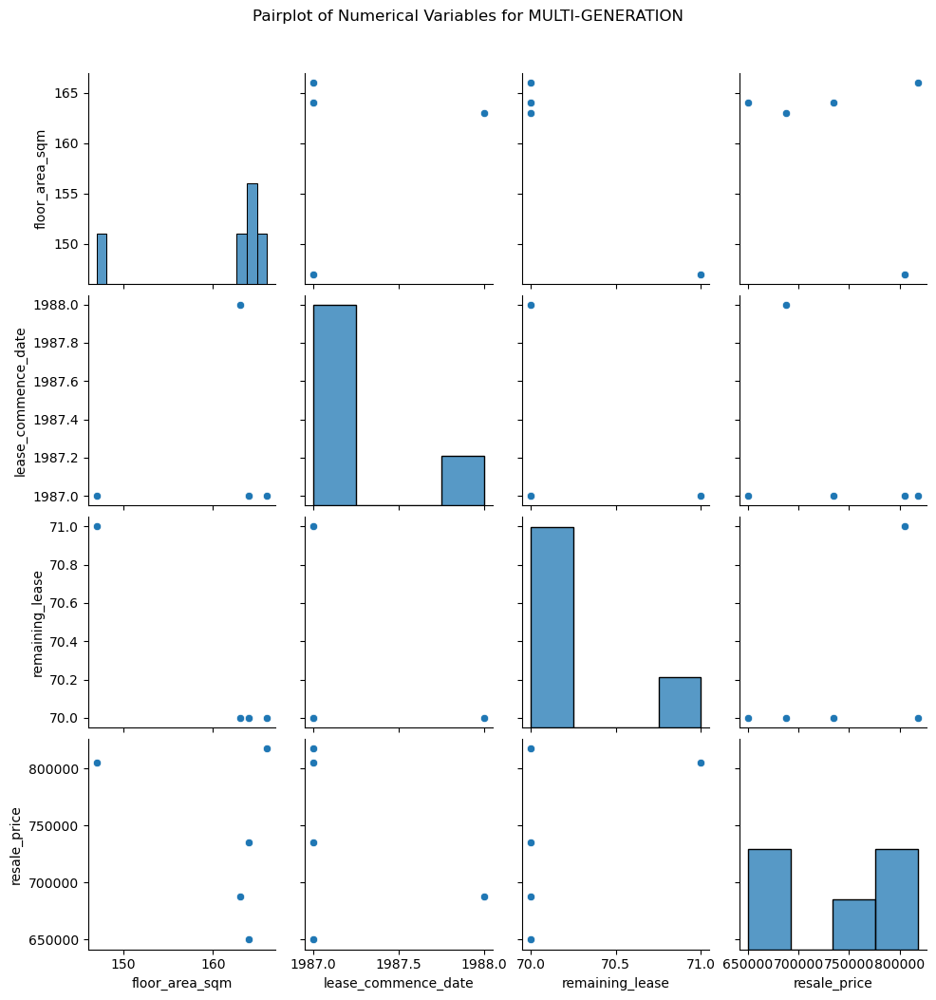

In [ ]:
# Assuming df is your DataFrame containing the dataset
grouped_df = df.groupby('flat_type')

# Suppressing warnings
warnings.filterwarnings("ignore")

for group, data in grouped_df:
    # Plotting pairplot for the numerical variables
    sns.pairplot(data[['floor_area_sqm', 'lease_commence_date', 'remaining_lease', 'resale_price']])
    plt.suptitle(f'Pairplot of Numerical Variables for {group}', y=1.05)
    plt.show()

### Town

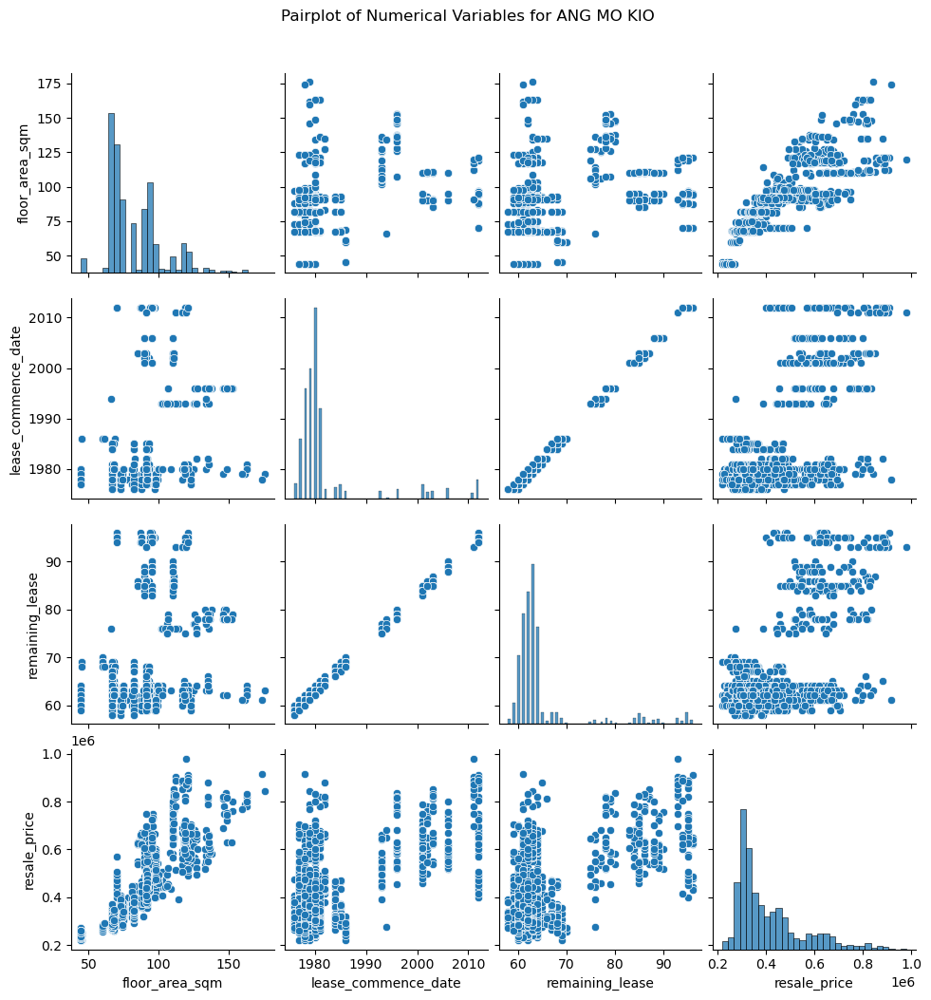

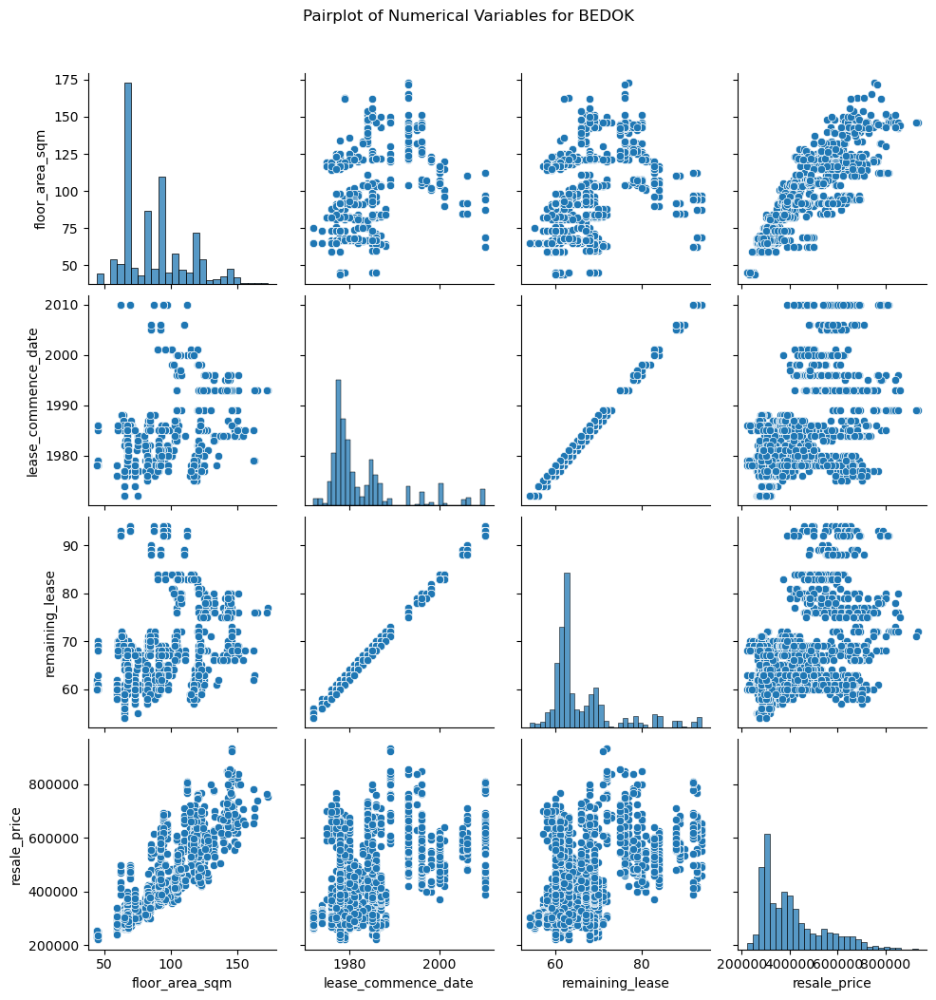

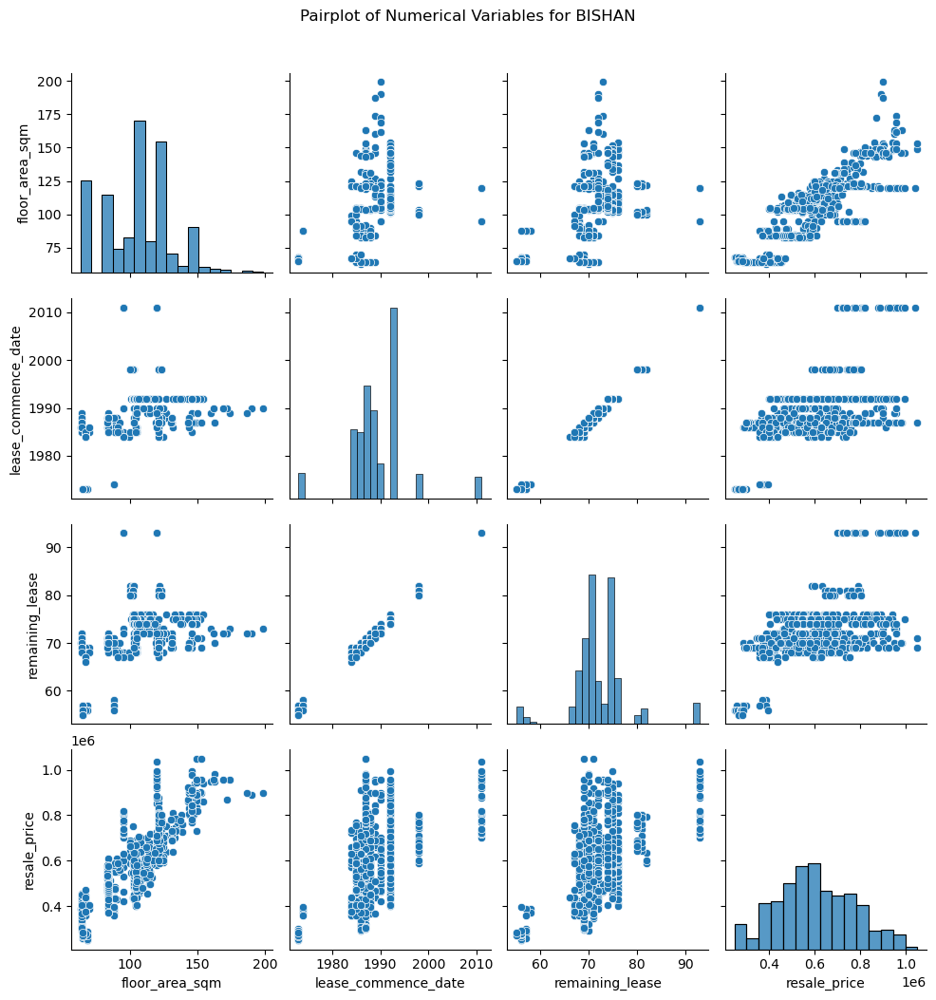

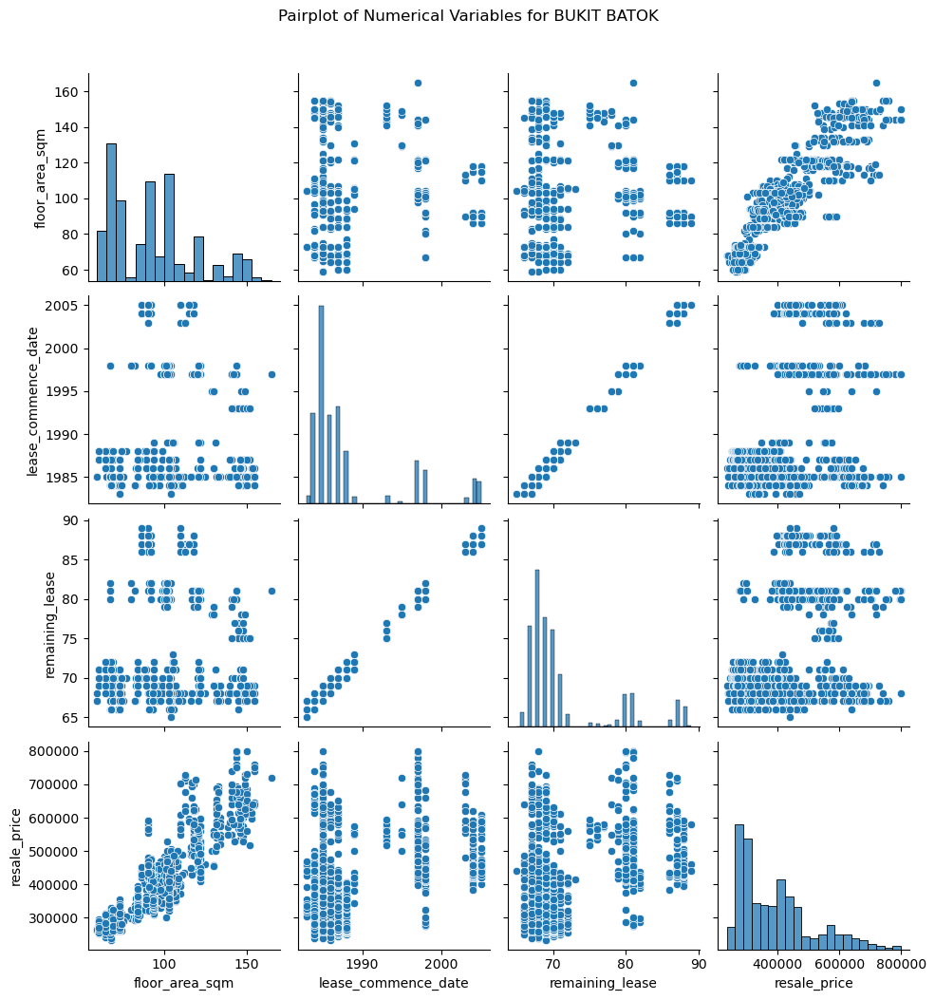

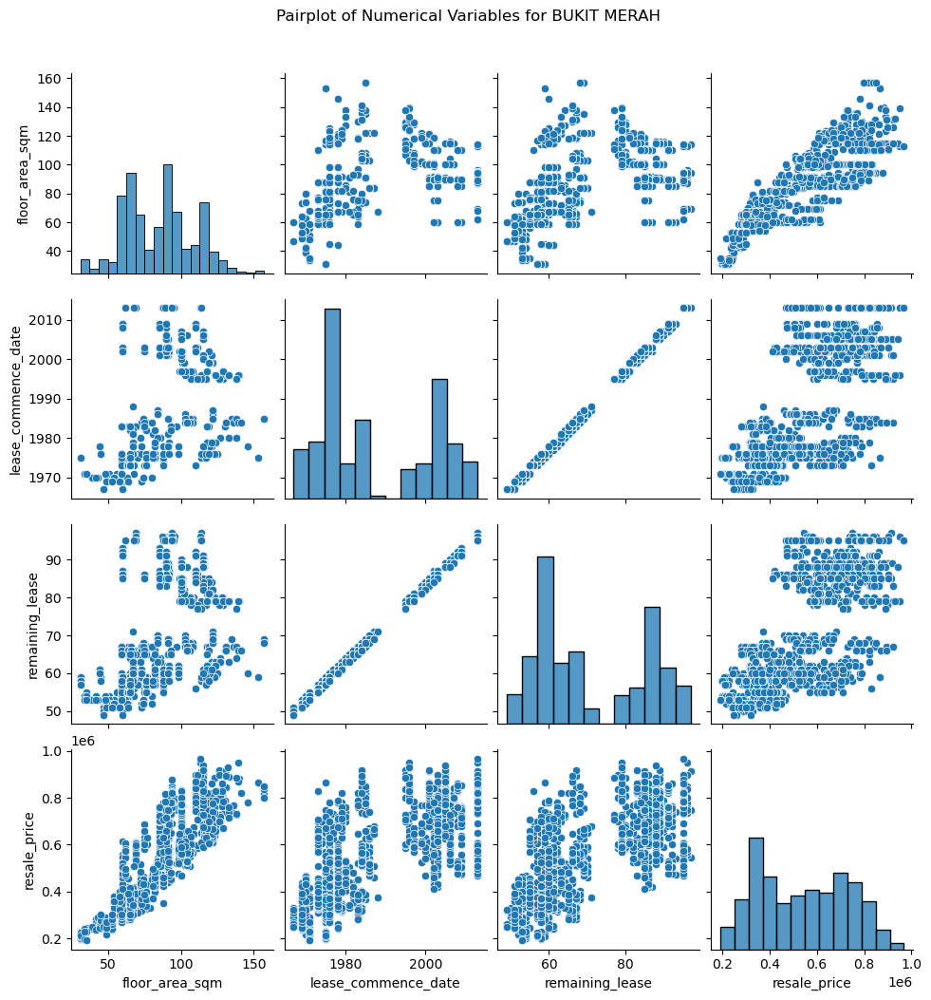

...

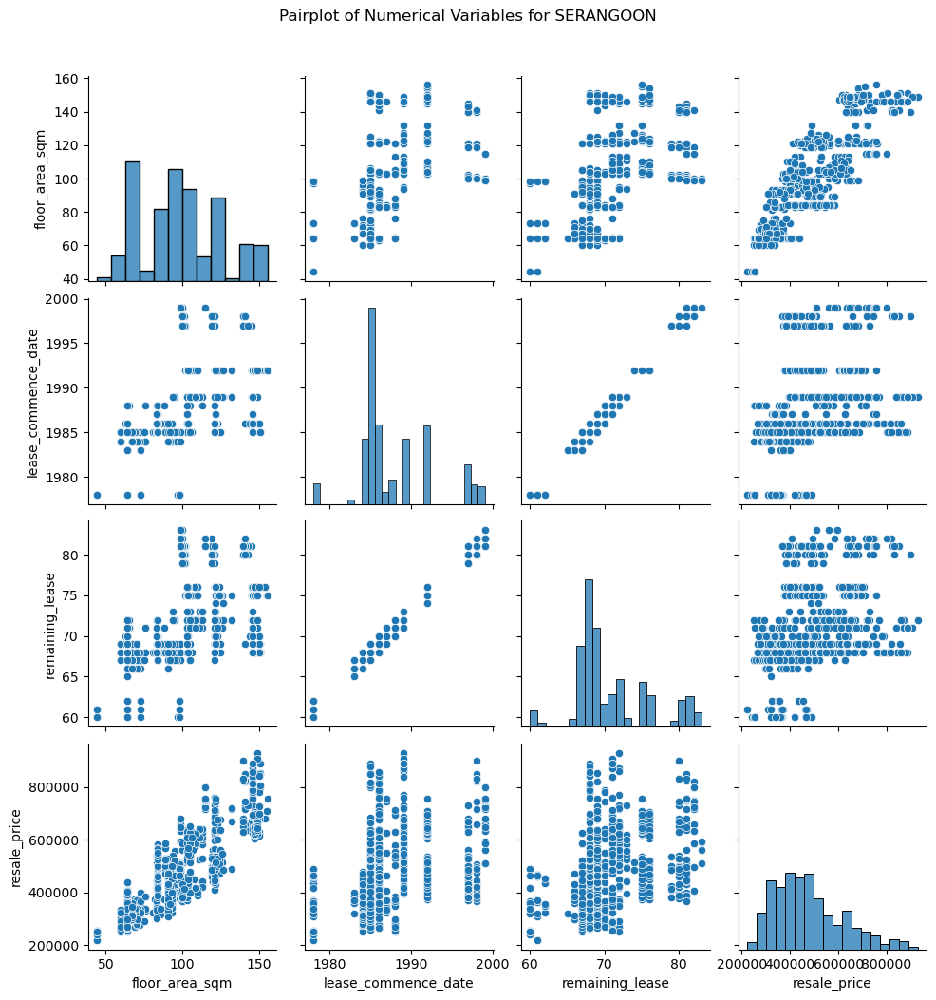

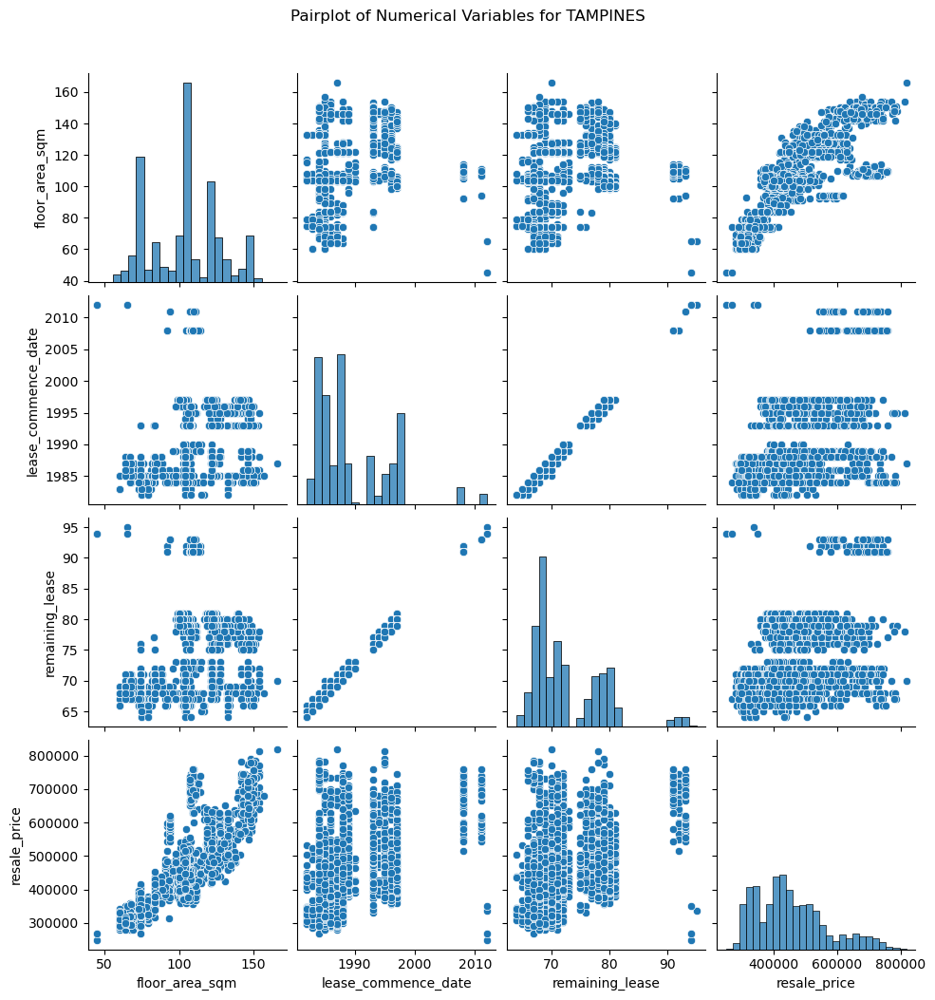

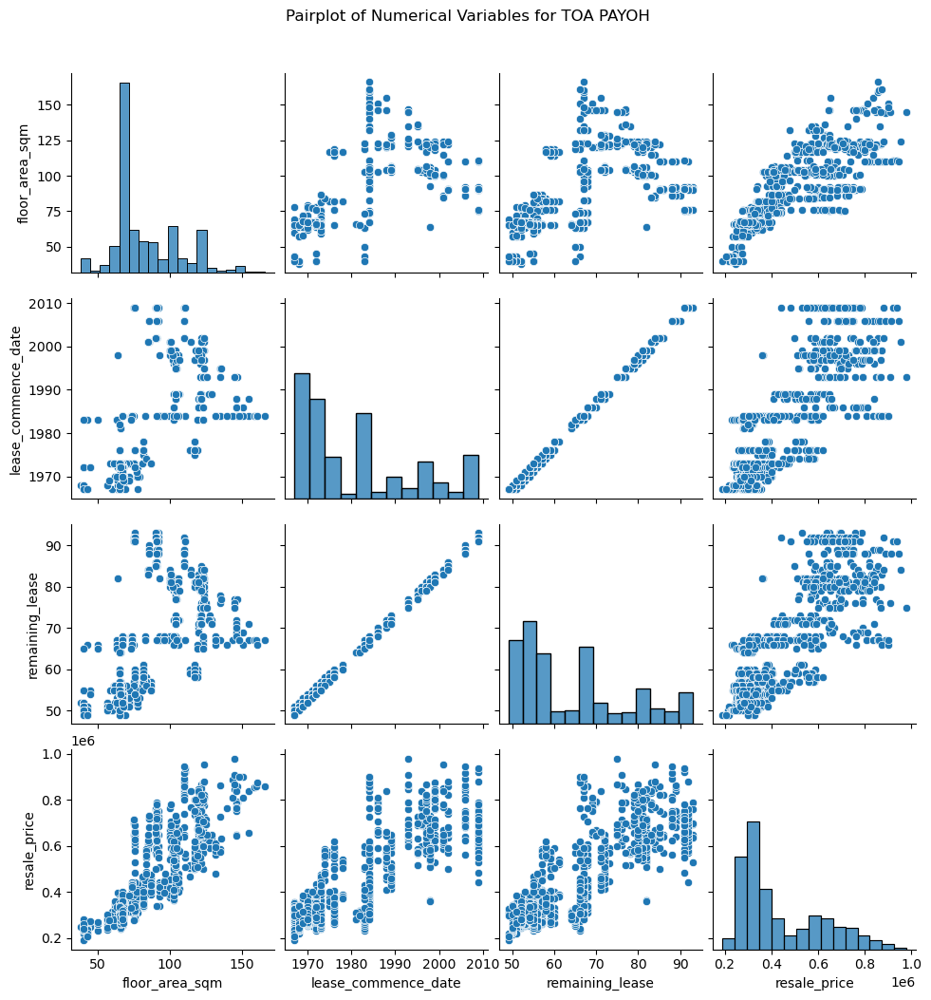

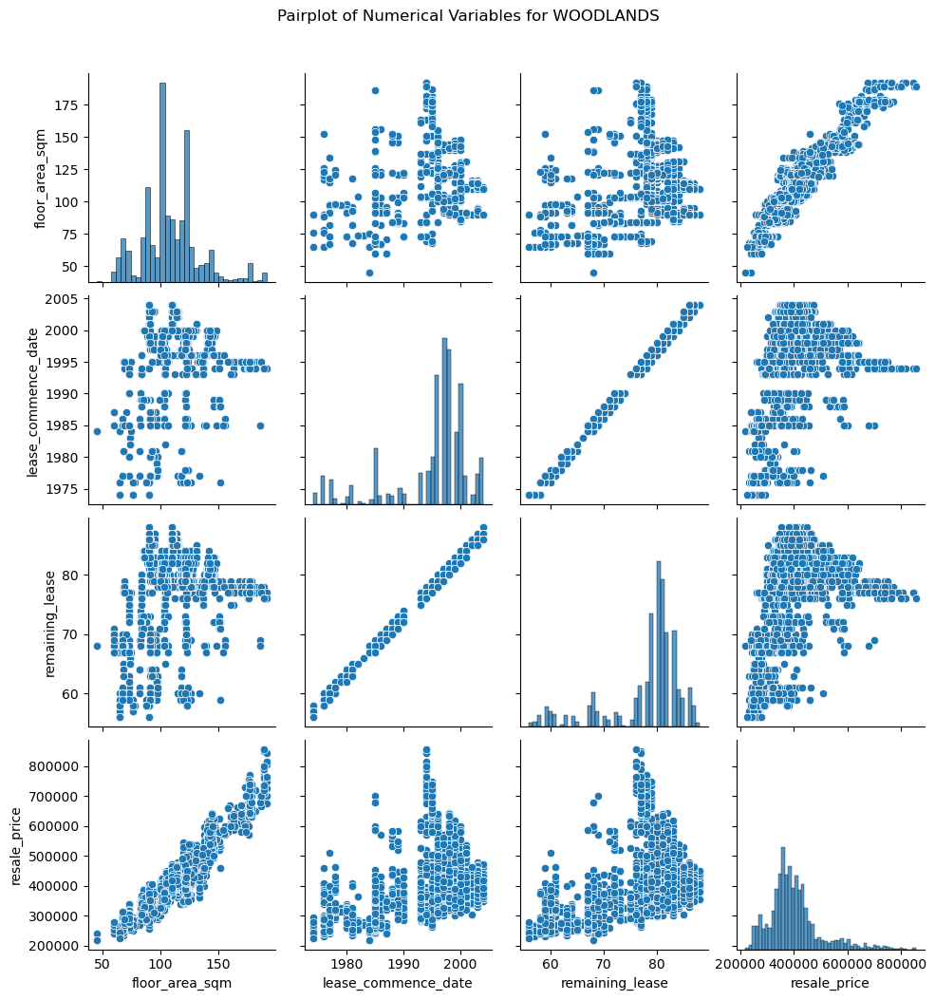

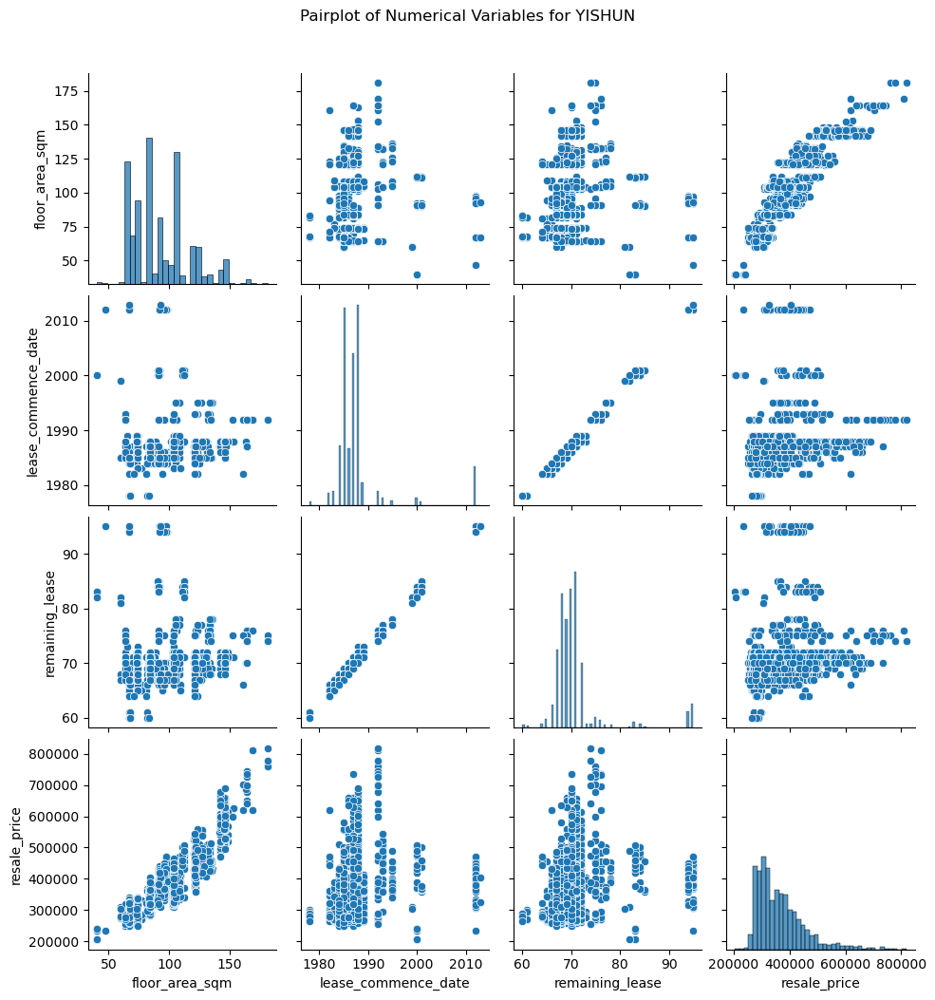

In [ ]:
# Assuming df is your DataFrame containing the dataset
grouped_df = df.groupby('town')

# Suppressing warnings
warnings.filterwarnings("ignore")

for group, data in grouped_df:
    # Plotting pairplot for the numerical variables
    sns.pairplot(data[['floor_area_sqm', 'lease_commence_date', 'remaining_lease', 'resale_price']])
    plt.suptitle(f'Pairplot of Numerical Variables for {group}', y=1.05)
    plt.show()

### Flat Model

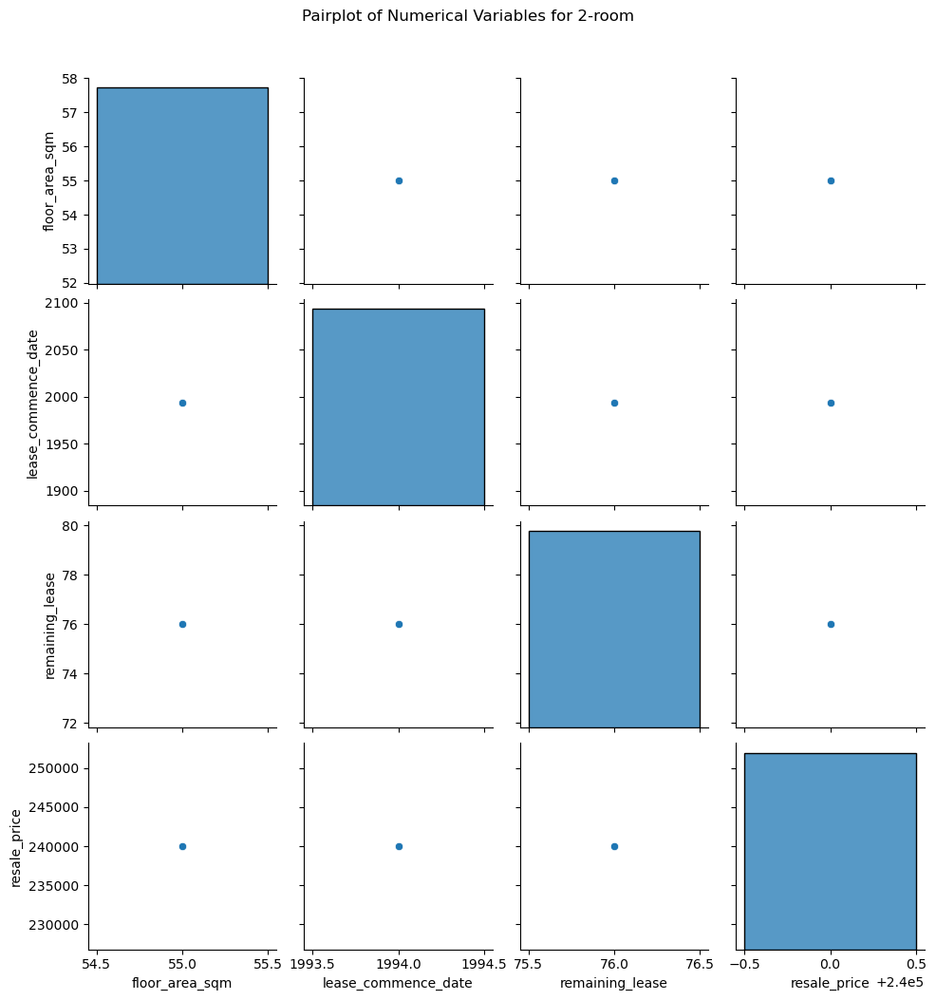

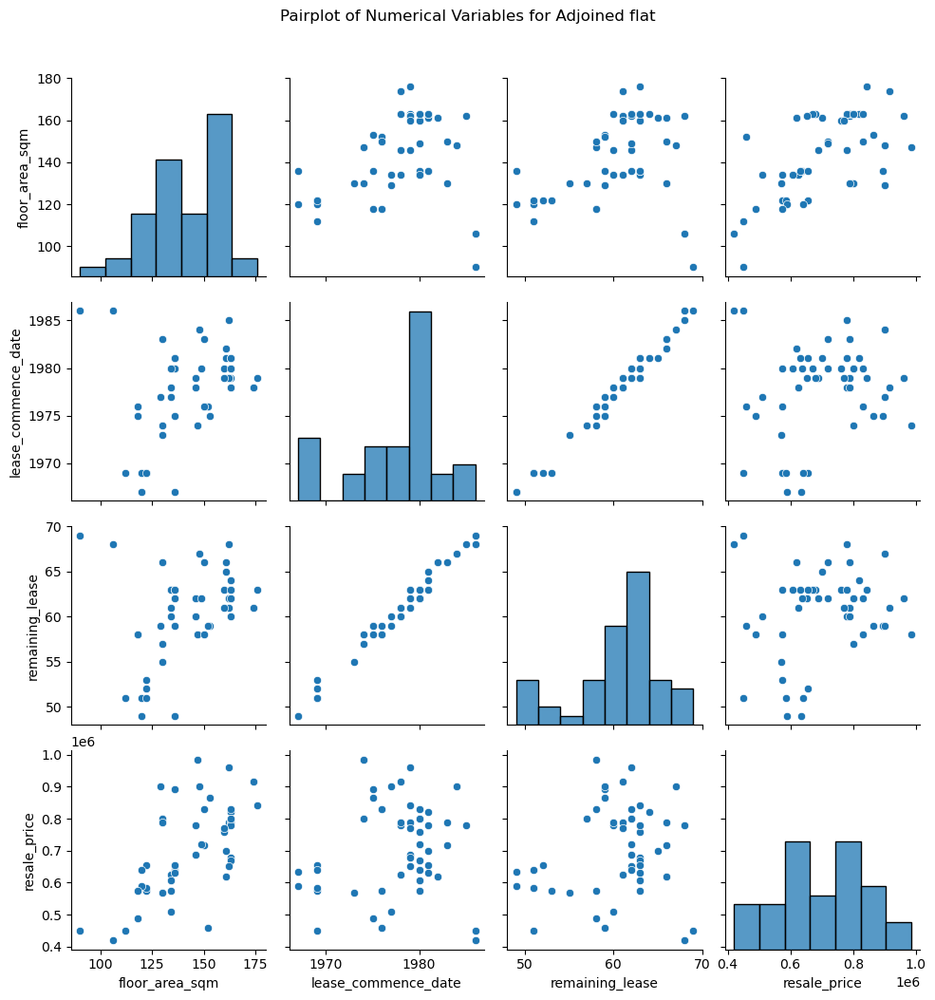

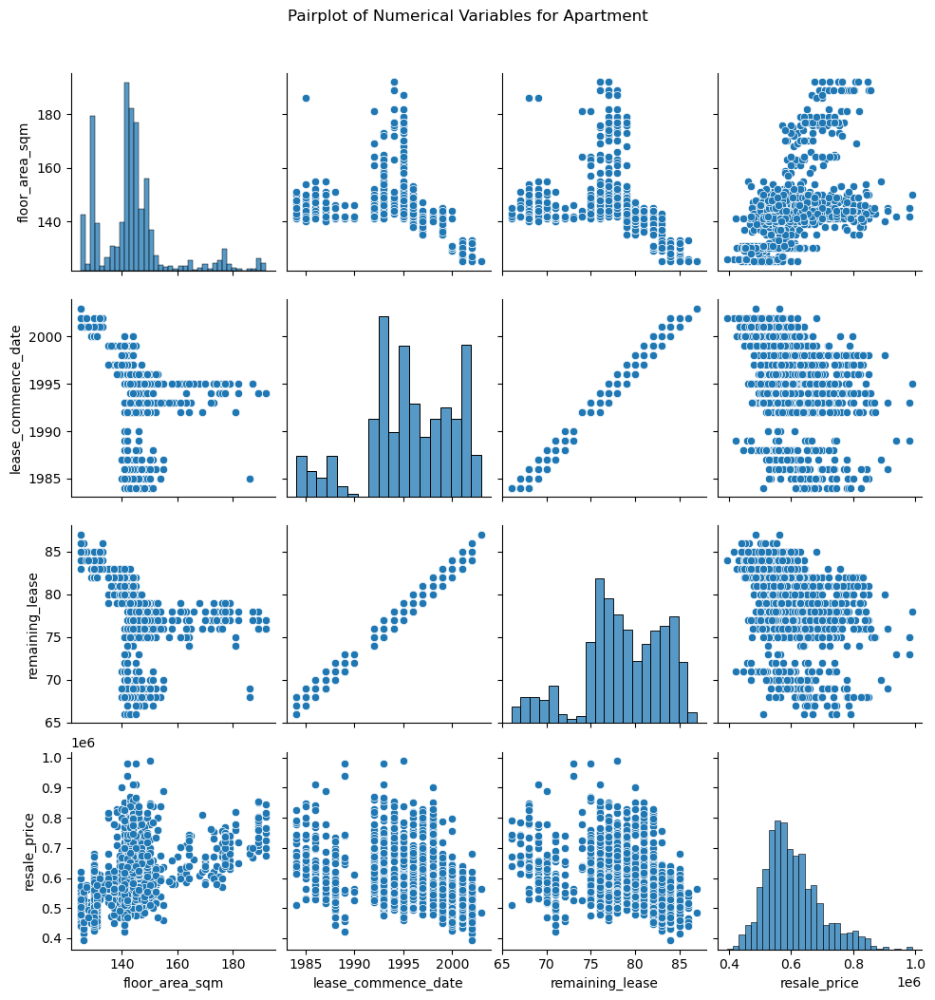

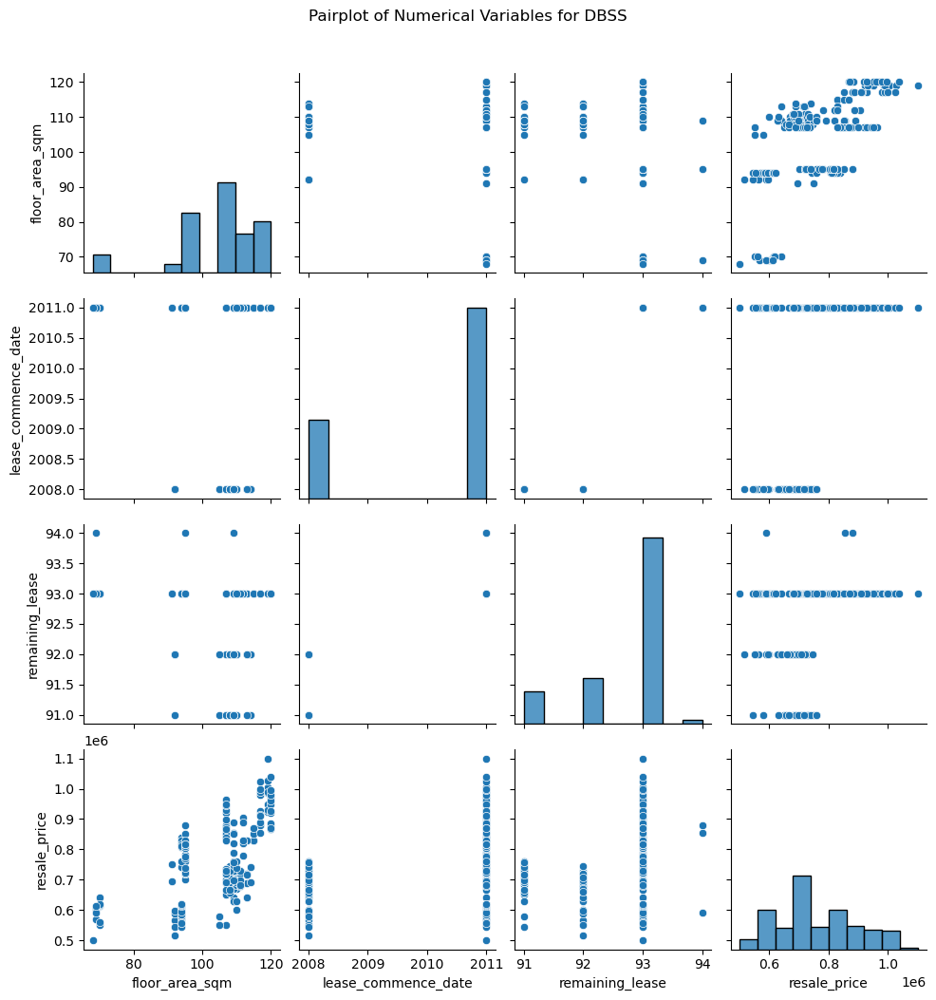

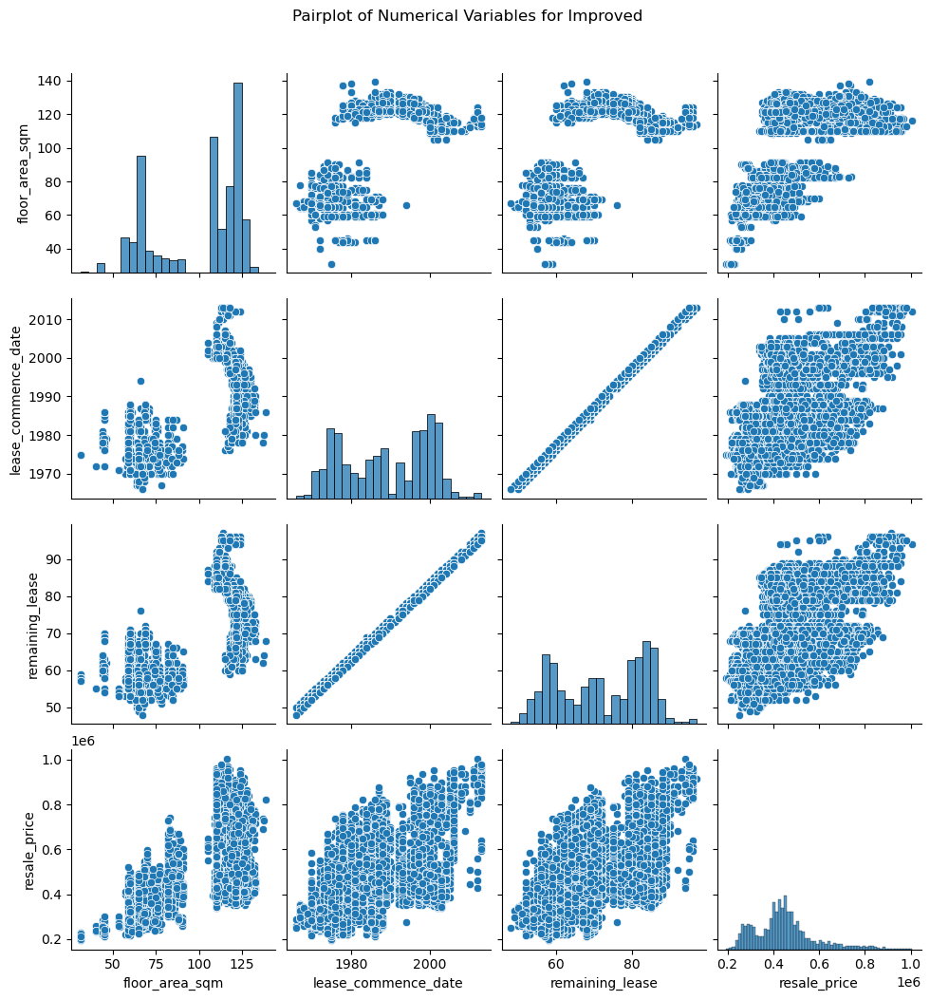

...

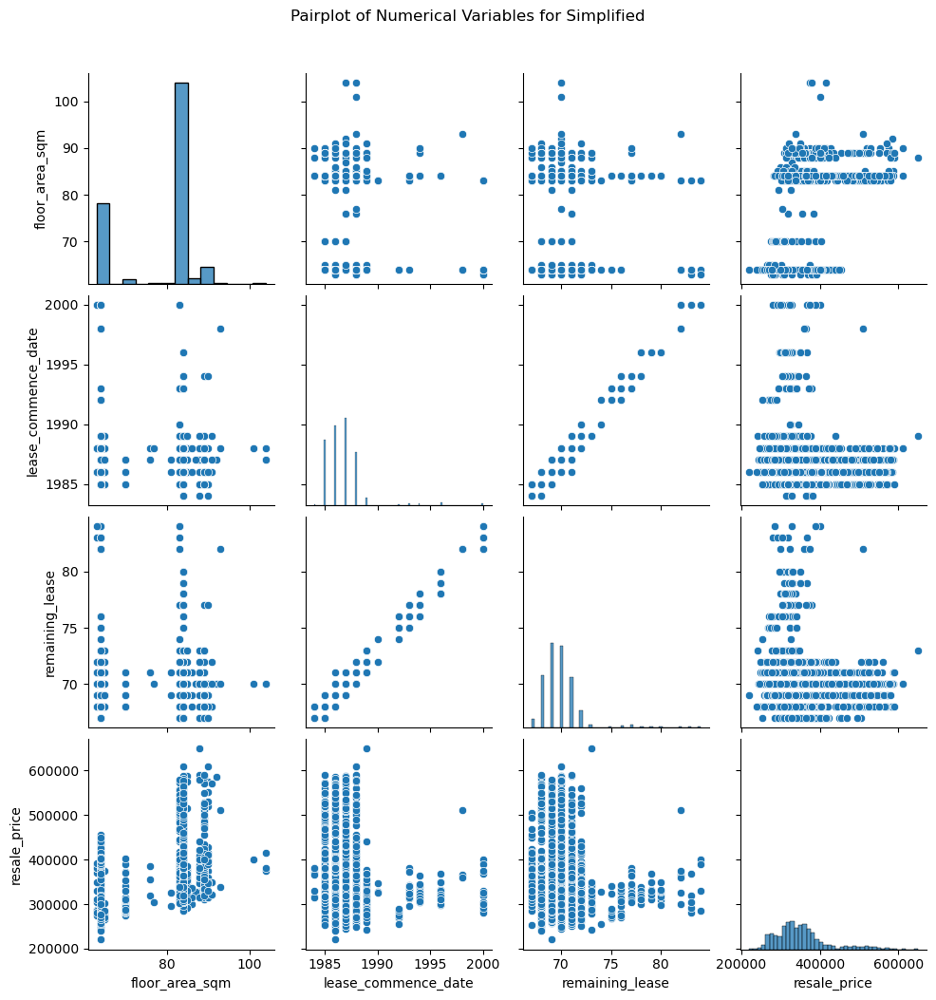

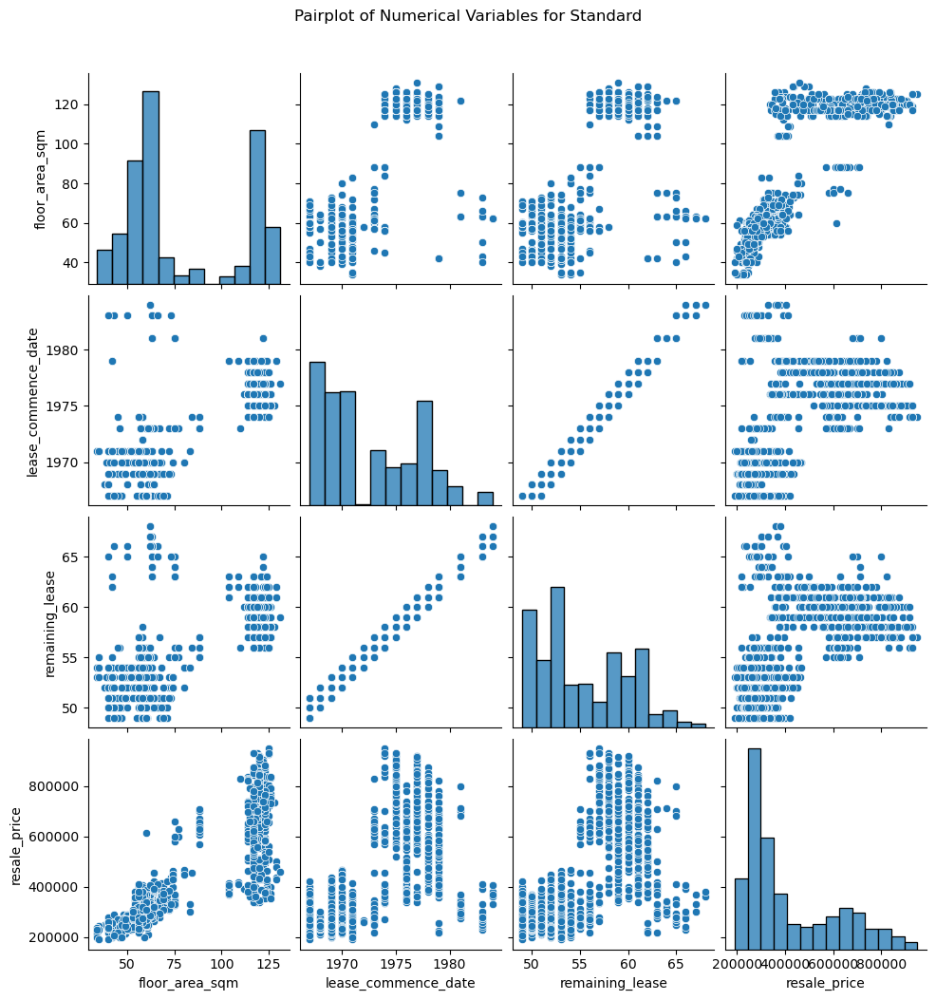

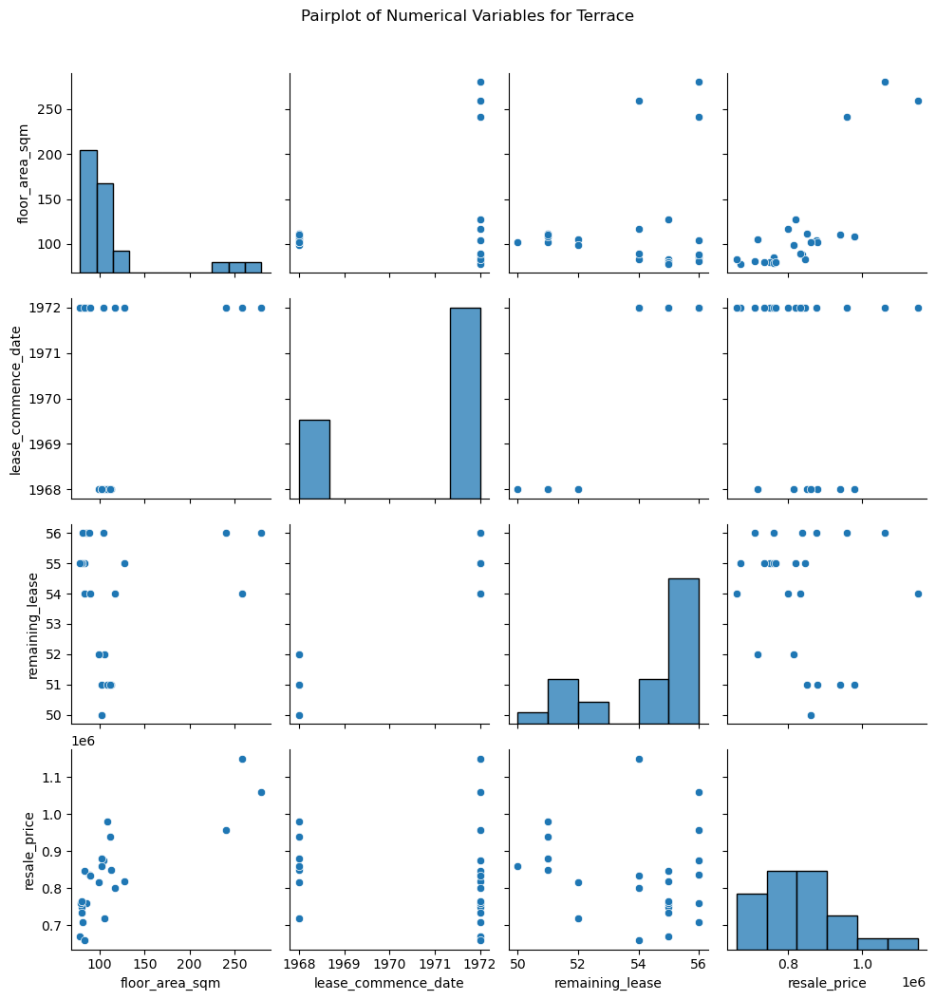

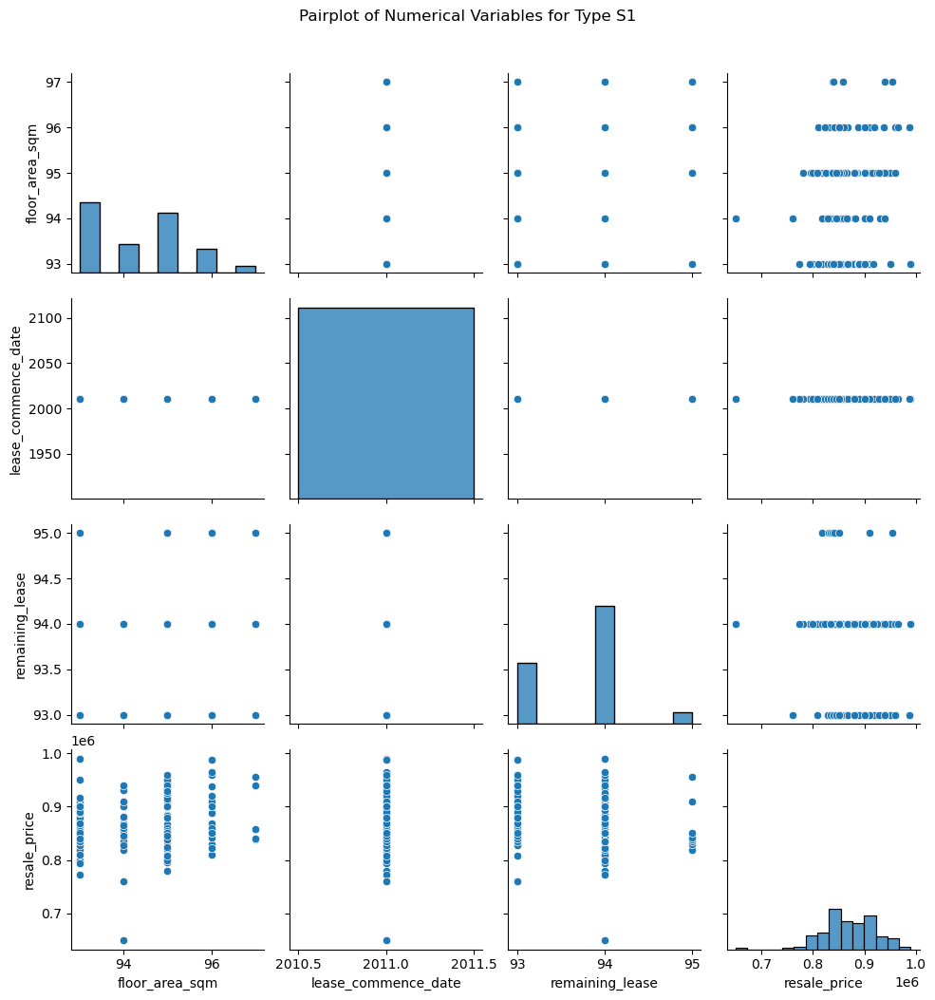

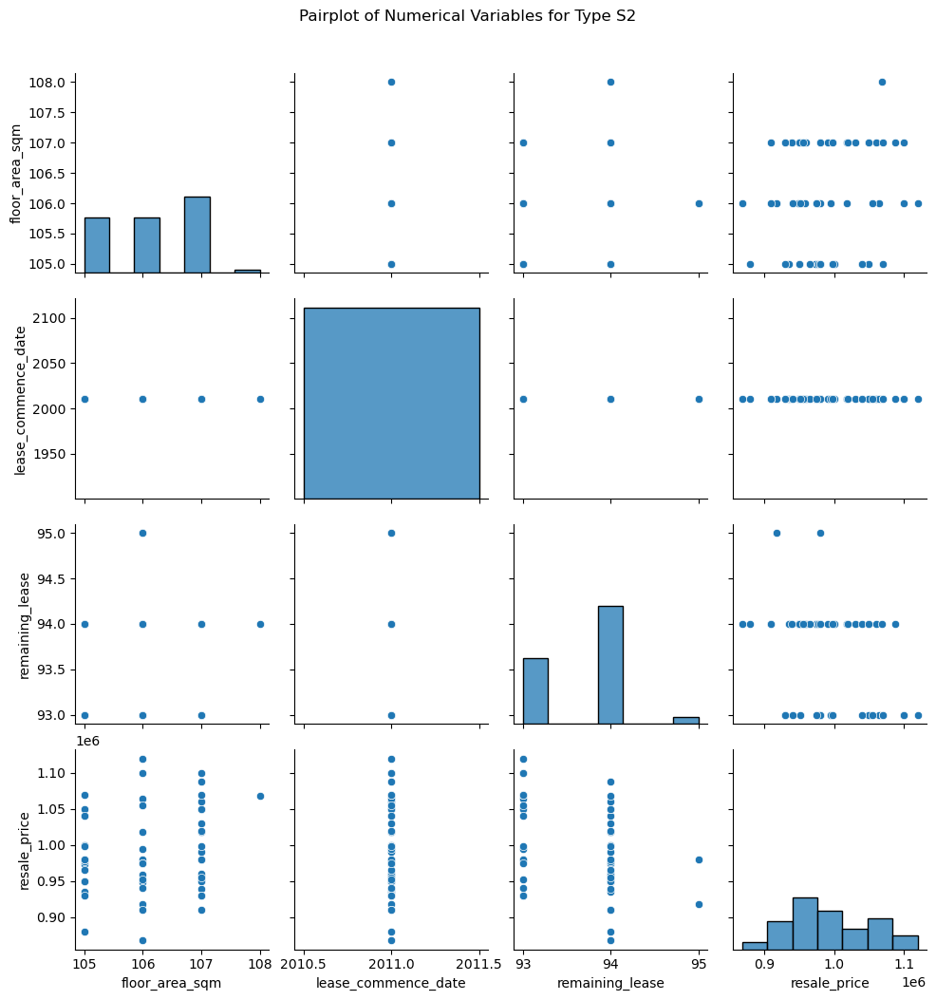

In [ ]:
# Assuming df is your DataFrame containing the dataset
grouped_df = df.groupby('flat_model')

# Suppressing warnings
warnings.filterwarnings("ignore")

for group, data in grouped_df:
    # Plotting pairplot for the numerical variables
    sns.pairplot(data[['floor_area_sqm', 'lease_commence_date', 'remaining_lease', 'resale_price']])
    plt.suptitle(f'Pairplot of Numerical Variables for {group}', y=1.05)
    plt.show()

## Distribution of resale prices

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['resale_price'], bins=30, kde=True)
plt.title('Distribution of Resale Prices')
plt.xlabel('Resale Price')
plt.ylabel('Frequency')

# Create a ScalarFormatter with no scientific notation
formatter = ScalarFormatter(useMathText=True)
formatter.set_scientific(False)
formatter.set_powerlimits((-3, 3))  # Adjust the limits if necessary

# Apply the formatter to the x-axis
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

NameError: name 'df' is not defined

<Figure size 1000x600 with 0 Axes>

# Boxplot of resale prices by town

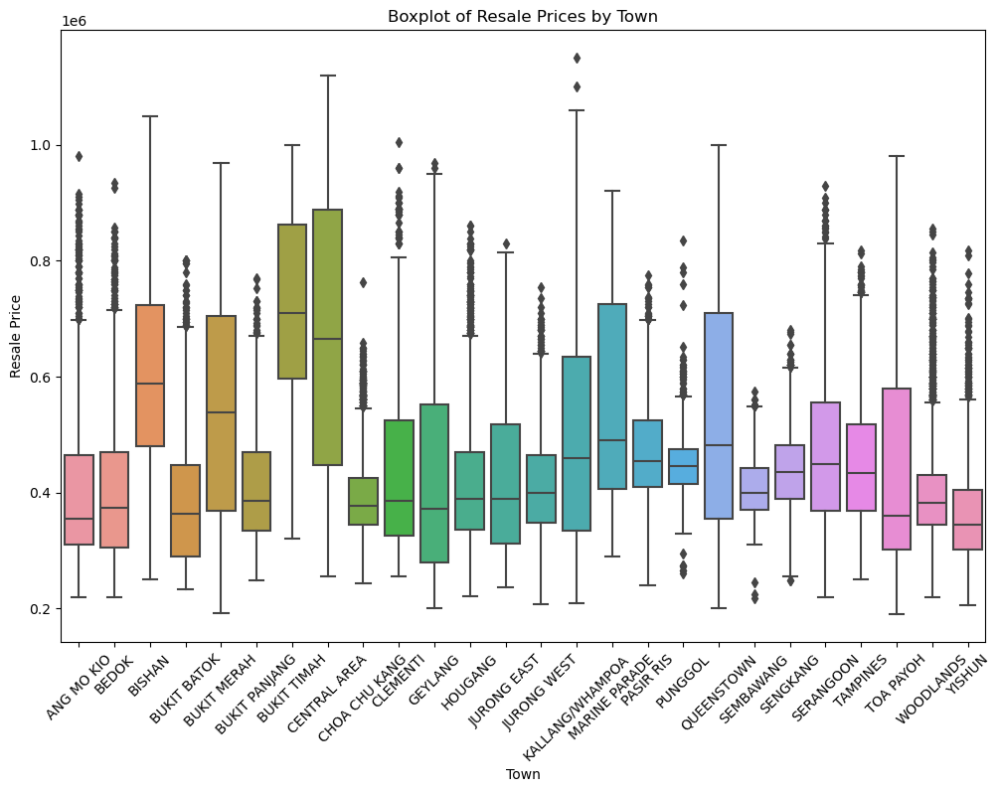

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='town', y='resale_price', data=df)
plt.title('Boxplot of Resale Prices by Town')
plt.xticks(rotation=45)
plt.xlabel('Town')
plt.ylabel('Resale Price')
plt.show()

## Heatmap for correlation matrix

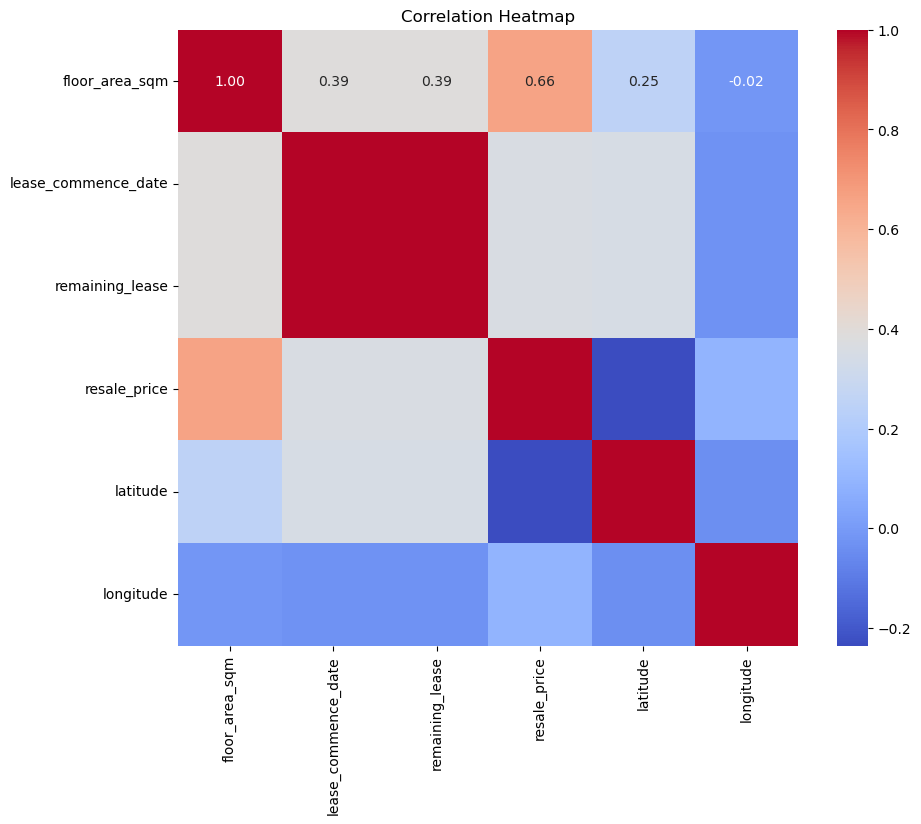

In [ ]:
numeric_columns = ['floor_area_sqm', 'lease_commence_date', 'remaining_lease', 'resale_price', 'latitude', 'longitude']
corr_matrix = df[numeric_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

1. **Floor Area and Resale Price**:
   - There's a positive correlation (0.66) between `floor_area_sqm` and `resale_price`, suggesting that larger flats generally sell for higher prices. This is a strong correlation and is consistent with real estate market expectations.

2. **Lease Commence Date, Remaining Lease, and Resale Price**:
   - Both `lease_commence_date` and `remaining_lease` show a moderate correlation with `resale_price` (0.25 and 0.39, respectively). This indicates that newer flats (or those with a longer remaining lease) tend to sell for more, but other factors may also play a significant role in determining the price.

3. **Lease Commence Date and Remaining Lease**:
   - As expected, there is a strong positive correlation (1.00) between `lease_commence_date` and `remaining_lease`, which makes sense since the remaining lease would directly depend on when the lease commenced.

4. **Latitude and Longitude**:
   - `Latitude` has a very weak correlation with `resale_price` (0.02), and `longitude` has no correlation (-0.02). This implies that within this dataset, the location specified by latitude and longitude does not have a simple linear relationship with the resale price. It's possible that the geographical variation within the towns included in the dataset is not large enough to show a clear pattern, or that location value is captured in other, more locally-specific factors.

5. **Latitude and Longitude with Other Variables**:
   - Both `latitude` and `longitude` show very weak to no correlation with `floor_area_sqm`, `lease_commence_date`, and `remaining_lease`. This suggests that within this dataset, the size and age of the flats are not strongly dependent on their exact geographical position.

6. **Interpreting the Heatmap Colors**:
   - Red indicates a positive correlation, blue indicates a negative correlation, and white indicates no correlation. The strength of the correlation is indicated by the intensity of the color, with darker shades representing stronger correlations.

# Check Data Statistics

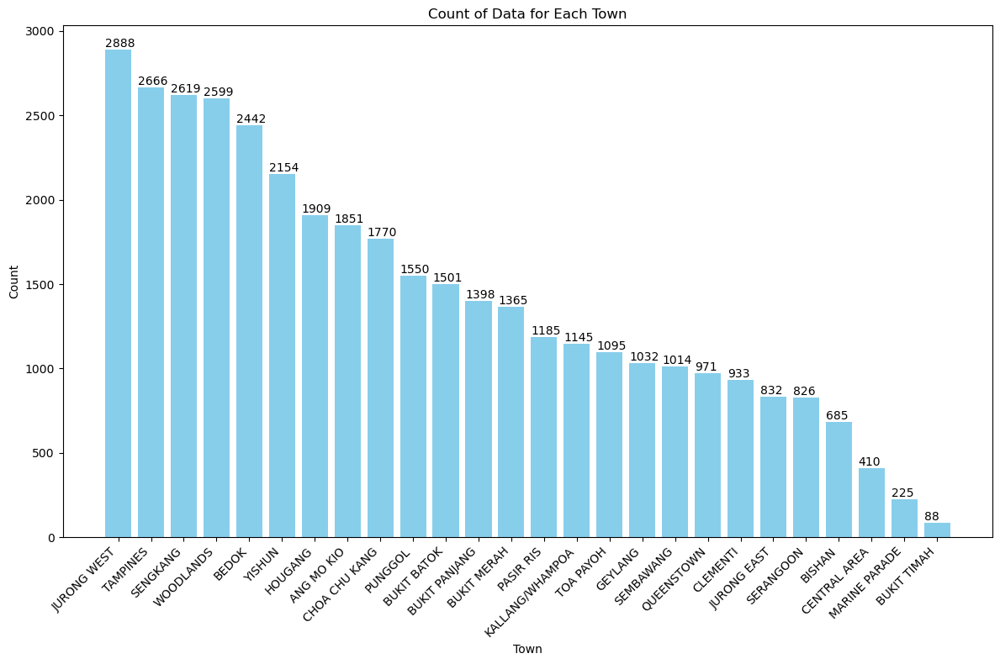

In [ ]:
town_counts = df['town'].value_counts().reset_index()
town_counts.columns = ['Town', 'Count']

plt.figure(figsize=(12, 8))
bars = plt.bar(town_counts['Town'], town_counts['Count'], color='skyblue')
plt.title('Count of Data for Each Town')
plt.xlabel('Town')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval, int(yval), va='bottom')

plt.tight_layout()
plt.show()

When training machine learning models, the distribution of data across different categories is crucial to consider. 

This dataset exhibits variability in the number of records for each town. Such discrepancies can lead to a bias in the machine learning model, where the model might perform well for towns with a higher number of data points because it 'learns' more from them. Conversely, the model might not generalize well to towns with fewer data points, leading to poor performance when predicting resale prices for these less-represented towns.